# Task 2 Clustering
*Alberto Roberto Marinelli, Giacomo Cignoni, Alessandro Bucci*
## Importing Libraries
First we import the libraries necessary to cluster the data

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from prettytable import PrettyTable
from tqdm import tqdm
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from scipy.stats import mode
from scipy.cluster.hierarchy import linkage, dendrogram, fclusterdata

Import DataFrame of generated user indicators (with excluded features due to high correlation)

In this clustering trial **we do not use entropy features**

In [6]:
df = pd.read_csv("../dataset/user_indicators_uncorrelated.csv") 
df.head(10)

,user_id,lang,bot,created_at,statuses_count,tweet_count,avg_text_len,entropy_minute,entropy_day,reply_count_avg,favorite_count_avg,num_hashtags_avg,num_urls_avg,num_mentions_avg,retweet_count_sum,favorite_count_sum
0,2353593986,en,1,2019-02-22 18:00:42,76,127,62.378788,2.535773,1.227162,0.000000,0.037879,0.098485,0.000000,0.272727,5,5
1,2358850842,en,0,2019-02-26 03:02:32,54,119,68.762295,2.302317,1.281955,0.000000,0.049180,0.024590,0.000000,0.336066,3,6
2,137959629,en,1,2015-04-30 07:09:56,3,4,19.250000,4.000000,1.265081,0.000000,0.000000,0.000000,0.000000,0.000000,0,0
3,466124818,it,1,2017-01-18 02:49:18,50,1394,86.763030,7.495216,0.347218,0.000000,0.166782,0.073662,0.022238,0.006254,1190,240
4,2571493866,en,0,2019-06-18 19:30:21,7085,3535,72.214442,5.999865,0.000000,0.000000,0.056072,0.117888,0.000821,0.505470,62,205
5,2199062688,en,0,2018-11-19 06:58:18,7406,1989,45.100913,5.677881,0.265405,0.000000,0.735704,0.024027,0.022585,0.928400,819284,1531
6,1174869769,en,1,2018-02-15 10:51:28,21,24,64.041667,4.175736,2.750914,0.000000,94.666667,0.458333,0.125000,0.125000,15124,2272
7,3118659848,en,0,2020-03-31 21:19:59,115,130,62.400000,5.602282,0.719549,0.000000,0.925926,0.111111,0.088889,0.807407,417191,125
8,616225564,en,0,2017-06-25 15:49:36,2041,58,66.883333,5.153498,3.087111,0.016667,0.050000,0.233333,0.033333,0.016667,4191,3
9,2357425536,en,1,2019-02-25 04:30:56,69,144,64.286667,2.239529,1.180164,0.000000,0.033333,0.100000,0.000000,0.340000,6,5


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11508 entries, 0 to 11507
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   user_id             11508 non-null  int64  
 1   lang                11508 non-null  object 
 2   bot                 11508 non-null  int64  
 3   created_at          11508 non-null  object 
 4   statuses_count      11508 non-null  int64  
 5   tweet_count         11508 non-null  int64  
 6   avg_text_len        11508 non-null  float64
 7   entropy_minute      11508 non-null  float64
 8   entropy_day         11508 non-null  float64
 9   reply_count_avg     11508 non-null  float64
 10  favorite_count_avg  11508 non-null  float64
 11  num_hashtags_avg    11508 non-null  float64
 12  num_urls_avg        11508 non-null  float64
 13  num_mentions_avg    11508 non-null  float64
 14  retweet_count_sum   11508 non-null  int64  
 15  favorite_count_sum  11508 non-null  int64  
dtypes: f

Exclude some user specific features that are not useful or no to be used in clustering

In [8]:
cat_feature = df[['user_id', 'lang', 'created_at']]
del df['user_id']
del df['lang']
del df['created_at']
del df['bot']
df.head()

,statuses_count,tweet_count,avg_text_len,entropy_minute,entropy_day,reply_count_avg,favorite_count_avg,num_hashtags_avg,num_urls_avg,num_mentions_avg,retweet_count_sum,favorite_count_sum
0,76,127,62.378788,2.535773,1.227162,0.0,0.037879,0.098485,0.000000,0.272727,5,5
1,54,119,68.762295,2.302317,1.281955,0.0,0.049180,0.024590,0.000000,0.336066,3,6
2,3,4,19.250000,4.000000,1.265081,0.0,0.000000,0.000000,0.000000,0.000000,0,0
3,50,1394,86.763030,7.495216,0.347218,0.0,0.166782,0.073662,0.022238,0.006254,1190,240
4,7085,3535,72.214442,5.999865,0.000000,0.0,0.056072,0.117888,0.000821,0.505470,62,205


## Clustering Preprocessing - Normalization  
A good practice in clustering to avoid the bias given by the range of the different attribute is normalization.  
The most common adopted normalizations are: Z-Score and Min-Max.

We tried both normalizations to be used in subsequent clusterings.

In [9]:
scaler = StandardScaler()
X_std = scaler.fit_transform(df.values)

In [10]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(df.values)

## K-MEANS

For K-Means we chose to use **minmax normalization**, as it is known to be a more suited normalization for this algorithm.

This function returns a set of trained K-Means from a list of possible k values

In [11]:
def KMeansFunction (X, n_clusters_list, n_init_value, max_iter_value=300):
    kmeans_list = list()

    for numCluster in tqdm(n_clusters_list):
        # Define and fit K-Means
        kmeans = KMeans(n_clusters=numCluster, n_init=n_init_value, max_iter=max_iter_value)
        kmeans.fit(X)
        kmeans_list.append(kmeans)
    
    return kmeans_list

Now we generate the K-Means clusterings and evaluate them.

In [12]:
# Params for kmeans
clusters_list = [x for x in range(1, 31)]
init_value = 10
iter_value = 300

# Get list of kmeans with from the list of possible k
kmeans_list = KMeansFunction (X_minmax, clusters_list, init_value, iter_value)

# Calculate SSE and Silhouette for each kmeans
sse_list = []
silhouette_list = []
for i, kmeans in enumerate(kmeans_list):
    sse_list.append(kmeans.inertia_)
    try: # Exception in case of num_clusters=1
        silhouette = silhouette_score(X_minmax, kmeans.labels_)
    except:
        silhouette = np.nan # silhouette returns exception when there is only 1 label
    silhouette_list.append(silhouette)

    print('K:', clusters_list[i], ' - SSE:', kmeans.inertia_, '- SILHOUETTE:', silhouette)


100%|██████████| 30/30 [00:12<00:00,  2.36it/s]


K: 1  - SSE: 2534.205801017384 - SILHOUETTE: nan
K: 2  - SSE: 1085.0904732120428 - SILHOUETTE: 0.5453593408122225
K: 3  - SSE: 704.4285787009914 - SILHOUETTE: 0.5584255549526996
K: 4  - SSE: 419.38339612176446 - SILHOUETTE: 0.5815165473818152
K: 5  - SSE: 358.68789401983196 - SILHOUETTE: 0.568304444080818
K: 6  - SSE: 323.4005189977486 - SILHOUETTE: 0.543722331904023
K: 7  - SSE: 298.72644504242726 - SILHOUETTE: 0.5266809491833633
K: 8  - SSE: 277.71934480510777 - SILHOUETTE: 0.4719521757567152
K: 9  - SSE: 253.55584283581672 - SILHOUETTE: 0.4702592981965523
K: 10  - SSE: 236.5139364893913 - SILHOUETTE: 0.4762512202294826
K: 11  - SSE: 223.35121929961127 - SILHOUETTE: 0.4773024585931684
K: 12  - SSE: 213.12251727993564 - SILHOUETTE: 0.4790285006462353
K: 13  - SSE: 203.53569524626502 - SILHOUETTE: 0.4834917979189321
K: 14  - SSE: 194.94022238712796 - SILHOUETTE: 0.48414094312725353
K: 15  - SSE: 187.9887086693604 - SILHOUETTE: 0.4843159192455408
K: 16  - SSE: 179.2381506184177 - SILHOU

Plot SSE graph

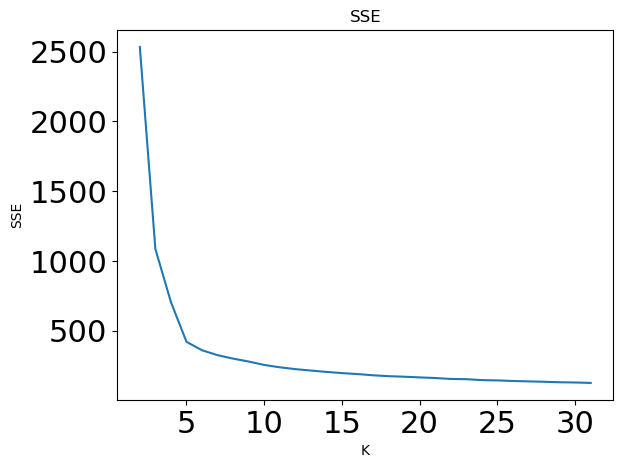

In [13]:
plt.plot(range(2, len(sse_list) + 2), sse_list)
plt.ylabel('SSE')
plt.xlabel('K')
plt.tick_params(axis='both', which='major', labelsize=22)
plt.xticks(clusters_list[4::5])
plt.title('SSE')
plt.show()

Plot Silhouette graph

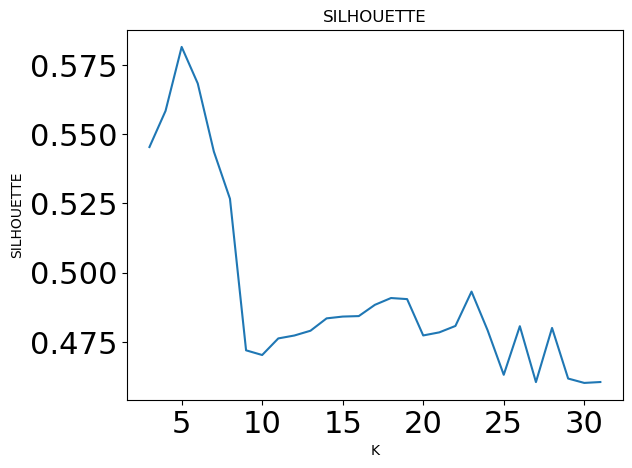

In [14]:
plt.plot(range(2, len(silhouette_list) + 2), silhouette_list)
plt.ylabel('SILHOUETTE')
plt.xlabel('K')
plt.tick_params(axis='both', which='major', labelsize=22)
plt.xticks(clusters_list[4::5])
plt.title('SILHOUETTE')
plt.show()

For K-Means, after analyizing SSE and Silhouette, we selected K=4, as it is approximately at the last significant SSE decrease in the SSE graph, while mantaining a relatively high Silhouette (Sihouette is high up to K=10 clusters). 

In [18]:
final_kmeans = kmeans_list[4]


[2 2 2 ... 2 2 4]


In [21]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(final_kmeans.labels_,index=df.index)

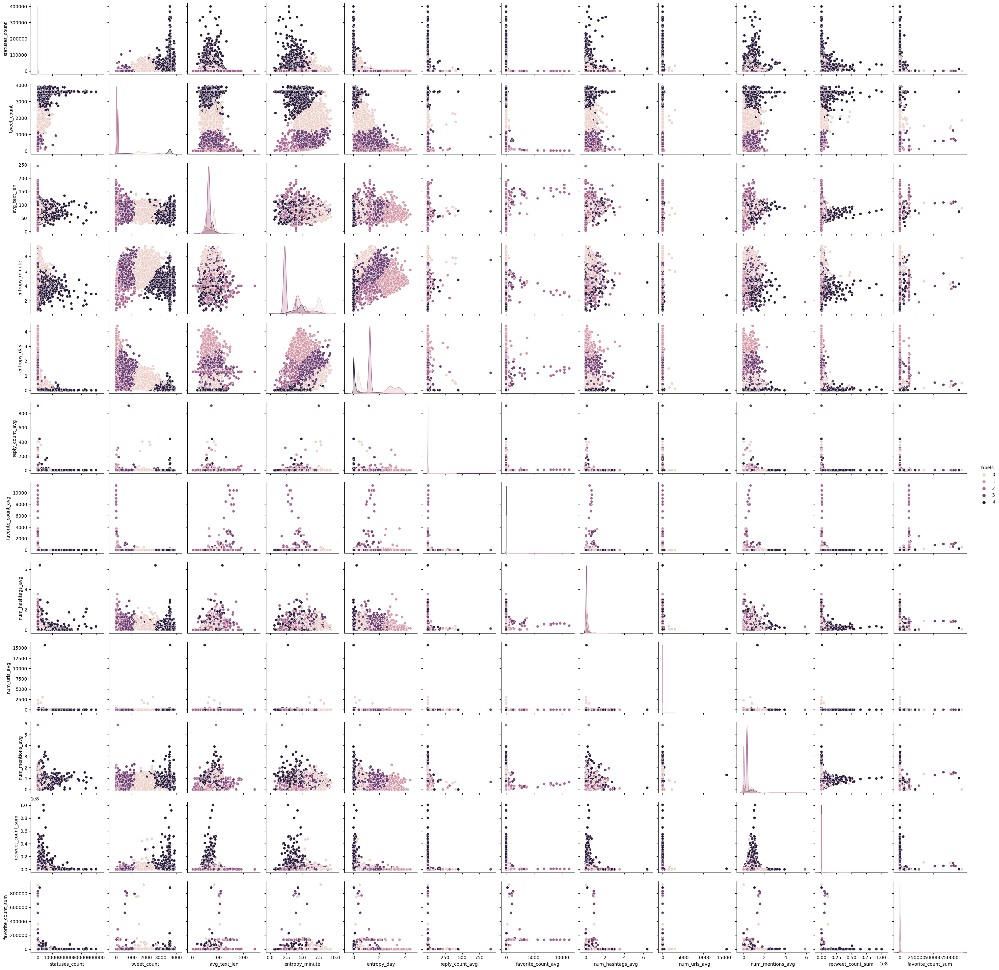

In [22]:
sns.pairplot(df,hue='labels')

scatter con plot adeguato

distribuzioni plot per ogni cluster (utilizzando label bot)

# DBSCAN

Function that shows graph of k-th nearest neighbour diastance in in order to use Knee Method to estimate the best eps. Multiple values of k are used.

In [23]:
def calc_k_nn_dist_graph(X):
    # List of k (for k-th nearest neighbour)
    k_list = [3, 4, 5 , 6]

    dist = pdist(X, 'euclidean') #pair wise distance
    dist = squareform(dist) #distance matrix given the vector dist

    # Calculate sorted list of distances for points for each k
    for k in k_list:
        kth_distances = list()
        for d in dist:
            index_kth_distance = np.argsort(d)[k]
            kth_distances.append(d[index_kth_distance])

        # Plot the graph of distance from k-th nearest neighbour
        plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
        plt.ylabel('dist from %sth neighbor' % k, fontsize=18)
        plt.xlabel('sorted distances', fontsize=18)
        plt.tick_params(axis='both', which='major', labelsize=22)
        f = plt.figure()
        f.set_figwidth(4)
        f.set_figheight(1)
        plt.show()

Function that returns a nested list of fitted DBSCANs, one for each combination of eps and minpts values that are passed as lists.

In [24]:
def db_scan_function (X, eps_list, minpts_list, max_iter_value=300):
    # Table with dim = len(eps_list) x len(minpts)
    dbscan_table = list()

    # Iterate over eps (rows)
    for i, eps in tqdm(enumerate(eps_list)):
        dbscan_table.append([]) 
        # Iterate over minpts
        for minpts in tqdm(minpts_list, leave=False):
            dbscan = DBSCAN(eps=eps, min_samples=minpts, n_jobs=-1)
            dbscan.fit(X)
            dbscan_table[i].append(dbscan)
    
    return dbscan_table

#### DBSCAN with **minmax normalization**

k-th nn graphs

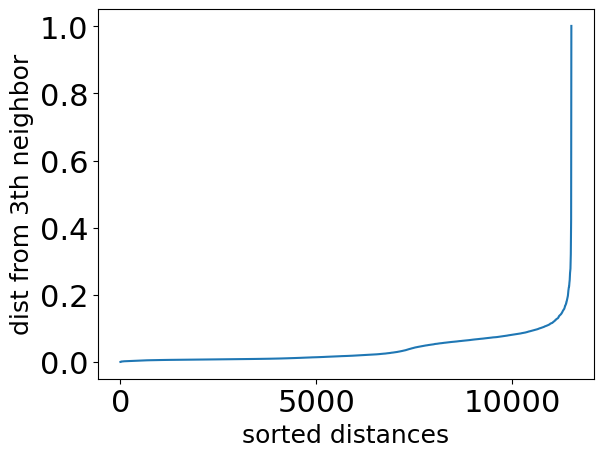

<Figure size 400x100 with 0 Axes>

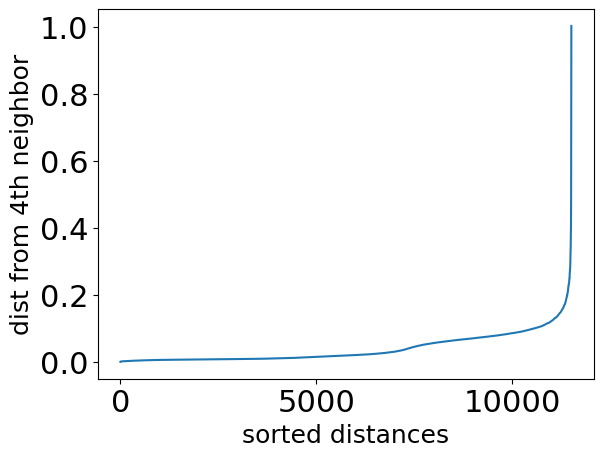

<Figure size 400x100 with 0 Axes>

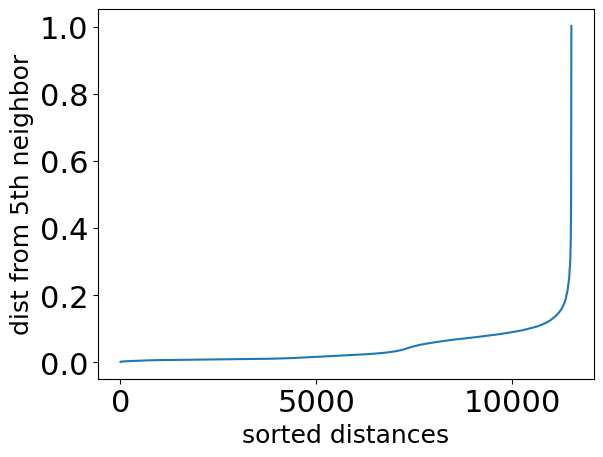

<Figure size 400x100 with 0 Axes>

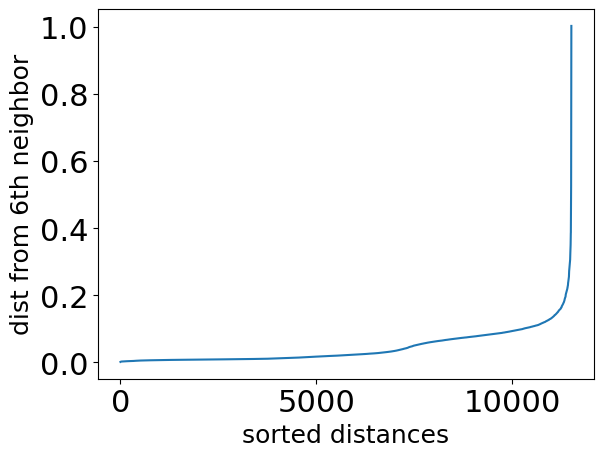

<Figure size 400x100 with 0 Axes>

In [25]:
calc_k_nn_dist_graph(X_minmax)

We select values for eps around 0.08-0.2 according to the knee method

Fit DBSCANs

In [26]:
eps_list = [0.08, 0.1, 0.15, 0.2] # min max vals
minpts_list = [2, 3, 4, 5] # min-max

# Table with fitted dbscans (rows are eps values, cols are minpts values)
dbscan_table = db_scan_function(X_minmax, eps_list, minpts_list)

4it [00:08,  2.21s/it]


Calculate and print Silhouette for each DBSCAN

In [27]:
t = PrettyTable()
t.field_names = ['eps\minpts'] + minpts_list

for i, eps in tqdm(enumerate(eps_list)):
    row_str = [str(eps)]
    for j, minpts  in tqdm(enumerate(minpts_list), leave=False):
        dbscan = dbscan_table[i][j]

        try: # Exception in case of num_clusters=1
            silhouette = round(silhouette_score(X_minmax, dbscan.labels_), 2)
        except:
            silhouette = np.nan
        cell_str = str(silhouette) + '-n_clust:'+str(len(np.unique(dbscan.labels_))-1)
        row_str.append(cell_str)

    t.add_row(row_str)

print('MINMAX normalization \n')
print(t)

4it [00:30,  7.55s/it]

MINMAX normalization 

+------------+-------------------+------------------+------------------+------------------+
| eps\minpts |         2         |        3         |        4         |        5         |
+------------+-------------------+------------------+------------------+------------------+
|    0.08    | -0.59-n_clust:110 | -0.52-n_clust:42 | -0.6-n_clust:25  | -0.52-n_clust:20 |
|    0.1     |  -0.57-n_clust:66 | -0.47-n_clust:24 | -0.37-n_clust:11 | -0.25-n_clust:7  |
|    0.15    |  -0.33-n_clust:22 | -0.23-n_clust:12 | -0.09-n_clust:6  |  0.01-n_clust:4  |
|    0.2     |   0.06-n_clust:9  |  0.21-n_clust:5  |  0.37-n_clust:3  |  0.36-n_clust:3  |
+------------+-------------------+------------------+------------------+------------------+


#### DBSCAN with **standard scaler**

k-th nn graphs

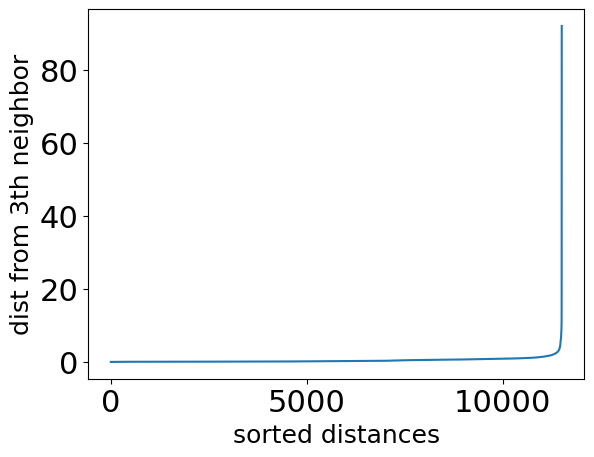

<Figure size 400x100 with 0 Axes>

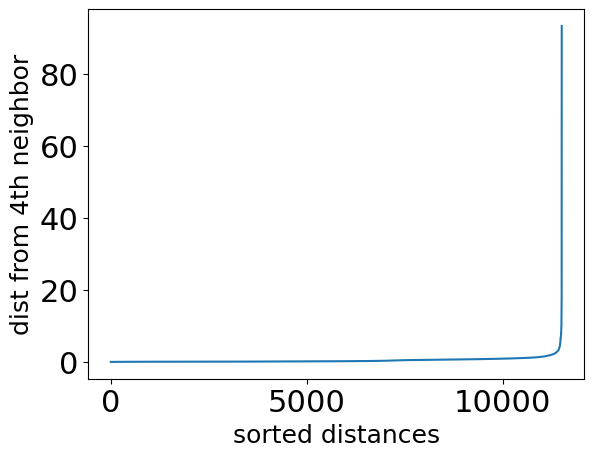

<Figure size 400x100 with 0 Axes>

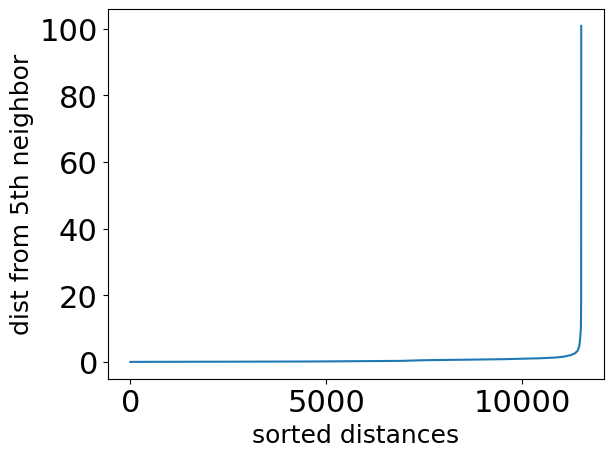

<Figure size 400x100 with 0 Axes>

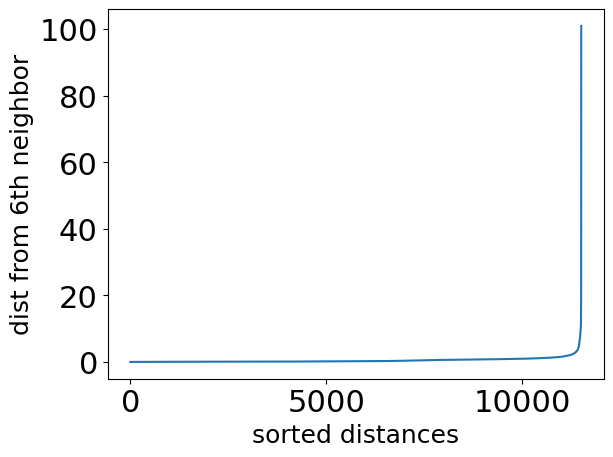

<Figure size 400x100 with 0 Axes>

In [28]:
calc_k_nn_dist_graph(X_std)

TODO: migliora grafico knn distances (cutoff a 20,  grid o yticks).
According to the Knee Method, we experimented with eps values in the range 1-3.

Fit DBSCANs

In [29]:
eps_list = [1, 1.25, 1.5, 2, 2.5, 3] 
minpts_list = [3, 4, 5, 6] 

# Table with fitted dbscans (rows are eps values, cols are minpts values)
dbscan_table = db_scan_function(X_std, eps_list, minpts_list)

6it [00:34,  5.67s/it]


Calculate and print Silhouette for each DBSCAN

In [30]:
t = PrettyTable()
t.field_names = ['eps\minpts'] + minpts_list


for i, eps in enumerate(eps_list):
    row_str = [str(eps)]
    for j, minpts  in enumerate(minpts_list):
        dbscan = dbscan_table[i][j]

        try: # Exception in case of num_clusters=1
            silhouette = round(silhouette_score(X_std, dbscan.labels_), 2)
        except:
            silhouette = np.nan
        cell_str = str(silhouette) + '-n_clust:'+str(len(np.unique(dbscan.labels_))-1)
        row_str.append(cell_str)
        #print('eps:', eps, 'minpts:', minpts ,' - Silhouette:', silhouette)
        #print('unique labels:', np.unique(dbscan.labels_))
    t.add_row(row_str)

print('STD normalization\n')
print(t)

STD normalization

+------------+------------------+------------------+----------------+----------------+
| eps\minpts |        3         |        4         |       5        |       6        |
+------------+------------------+------------------+----------------+----------------+
|     1      | -0.09-n_clust:27 | -0.05-n_clust:16 | 0.03-n_clust:8 | 0.38-n_clust:3 |
|    1.25    | -0.04-n_clust:18 |  0.04-n_clust:5  | 0.04-n_clust:6 | 0.35-n_clust:6 |
|    1.5     | 0.14-n_clust:11  |  0.2-n_clust:6   | 0.47-n_clust:2 | 0.47-n_clust:2 |
|     2      | 0.49-n_clust:11  |  0.59-n_clust:5  | 0.74-n_clust:2 | 0.74-n_clust:2 |
|    2.5     |  0.5-n_clust:8   |  0.5-n_clust:6   | 0.5-n_clust:5  | 0.63-n_clust:3 |
|     3      |  0.74-n_clust:5  |  0.74-n_clust:5  | 0.74-n_clust:3 | 0.63-n_clust:4 |
+------------+------------------+------------------+----------------+----------------+


After looking at the Silhouettes for both results tables of DBSCAN, we noted that std/mean normalization perform much better. 

Among the std/mean normalization results, we selected 2 clustering configurations for further analysis:
1.  eps: 2.5, minpts: 5, n_clusters: 3, Silhouette: 0.81
2.  eps: 3, minpts: 4, n_clusters: 6, Silhouette: 0.70

These 2 were selected because of their high Silhouette and because they have different number of clusters

In [31]:
DBSCAN_final_3 = dbscan_table[4][2] # DBSCAn with 3 clusters
DBSCAN_final_6 = dbscan_table[5][1] # DBSCAn with 6 clusters

scatter con plot adeguato

In [32]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(DBSCAN_final_3.labels_,index=df.index)

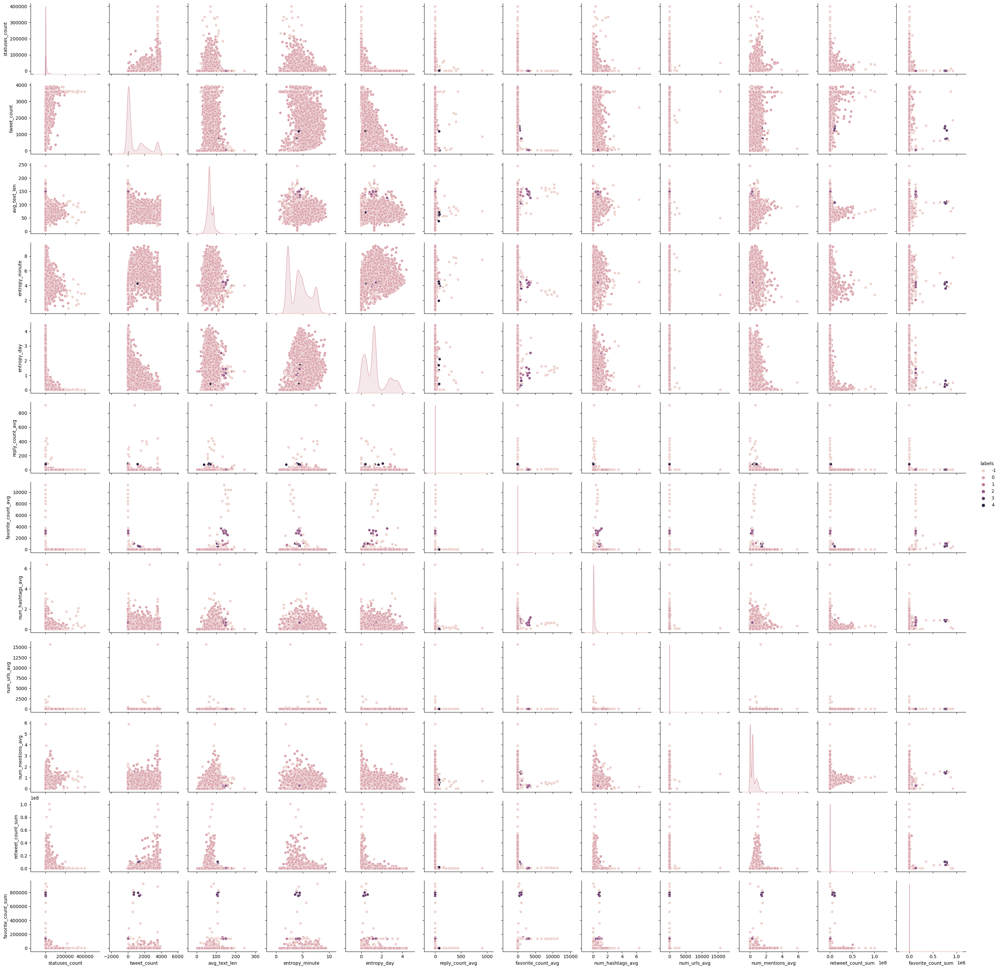

In [33]:
sns.pairplot(df,hue='labels')

In [34]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(DBSCAN_final_6.labels_,index=df.index)

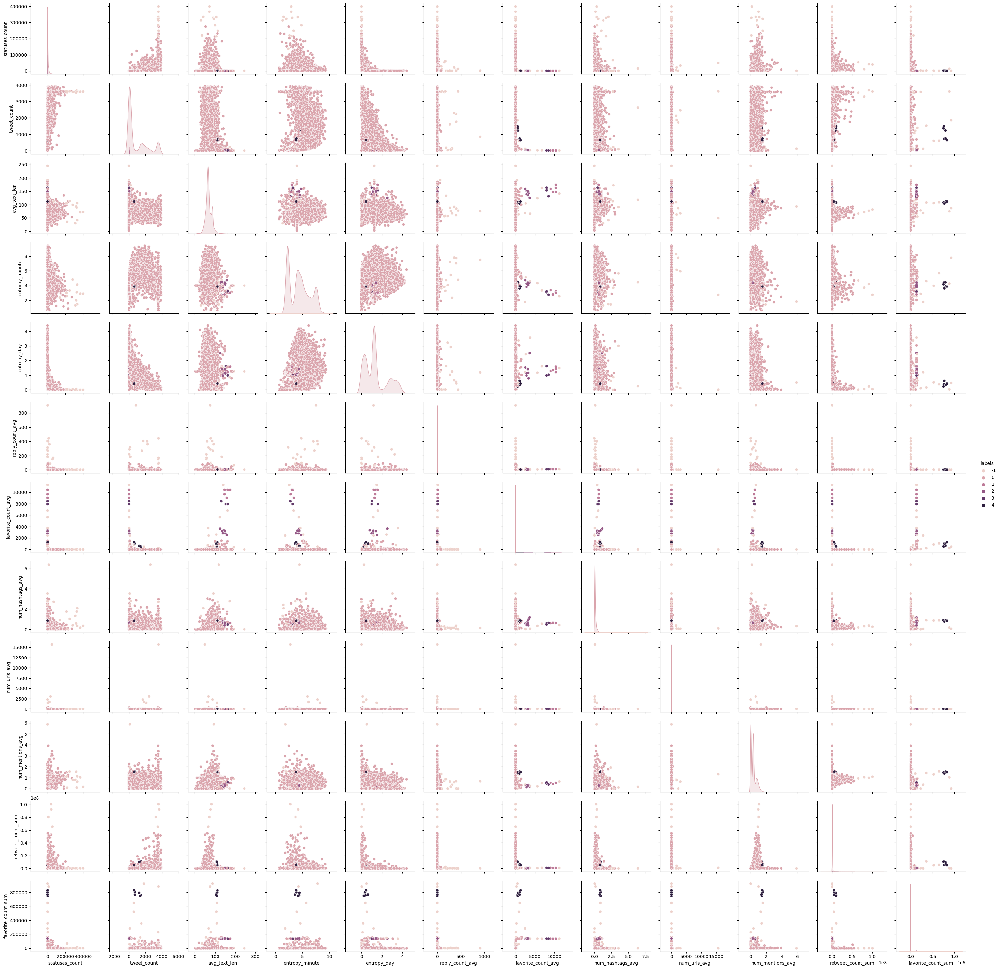

In [35]:
sns.pairplot(df,hue='labels')

distribuzioni plot per ogni cluster (utilizzando label bot)

# Hierarchical

In the following part, we explore agglomerative hierarchical clustering on our dataset.

After some preliminary trials we found that the best distance metric is **cosine**.

We also decided to discard "single" method, as it is sensitive to outliers and in our dataset we did not remove outliers based only on statistical methods.

Following we report the most significant dendograms of clusterings after having done a coarse selection of hierarchical clustering parameters after preliminary trials.

TODO: threshold selected on maximum length of dendogram branch

### With minmax normalization

In [36]:
config_hierarchical_minamx = []

Show generated dendrogram for hierarchical clustering with selected params and the best threshold for that dendrogram.

Method: **complete**, threshold: 0.65, n_clusters: **8**

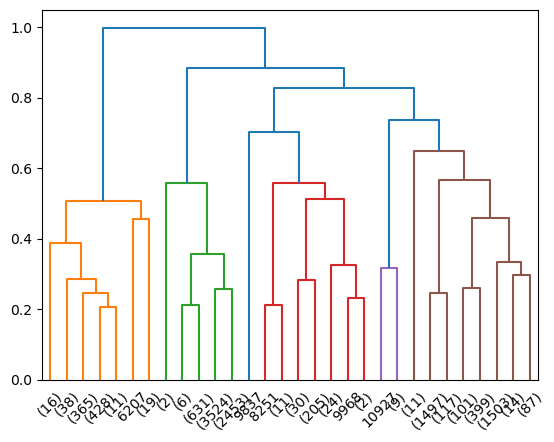

In [37]:
# Generate dendrogram
data_dist = pdist(X_minmax, metric='cosine')
data_link = linkage(data_dist, method='complete', metric='cosine')
res = dendrogram(data_link, color_threshold=0.65, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_minamx.append((0.65, 'cosine', 'complete'))

Method: **ward**, threshold: 20, n_clusters: **2**

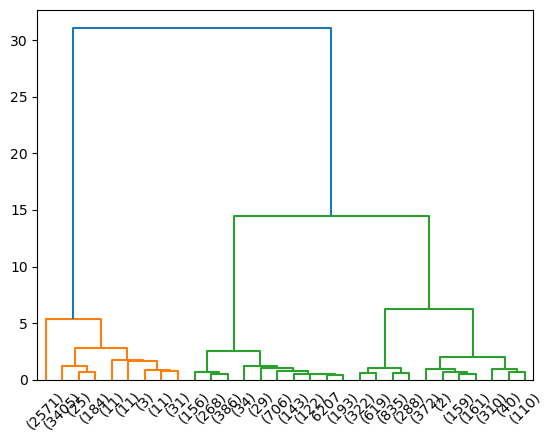

In [38]:
# Generate dendrogram
data_dist = pdist(X_minmax, metric='cosine')
data_link = linkage(data_dist, method='ward', metric='cosine')
res = dendrogram(data_link, color_threshold=20, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_minamx.append((20, 'cosine', 'ward'))

Fit clusterings with params found by exploring dendrograms

In [39]:
cluster_list_minax = []
for treshold, metric_minmax, method_minmax in config_hierarchical_minamx:
    cluster = fclusterdata(X=X_minmax,
     t=treshold , criterion='distance', metric=metric_minmax, method=method_minmax)
     
    cluster_list_minax.append(cluster)

Calculate Silhouette for each clustering.

In [40]:
for i, cluster in enumerate(cluster_list_minax):
    treshold, metric, method = config_hierarchical_minamx[i]

    try: # Exception in case of num_clusters=1
        silhouette = silhouette_score(X_minmax, cluster)
    except:
        silhouette = np.nan
    print("MINMAX - dist:", metric, ", method:", method, ", SILHOUTTE:", silhouette, ", n_clusters:", len(np.unique(cluster)))

MINMAX - dist: cosine , method: complete , SILHOUTTE: 0.24761829313629216 , n_clusters: 6
MINMAX - dist: cosine , method: ward , SILHOUTTE: 0.4662093747770608 , n_clusters: 2


We selected the clustering with *method: ward** and *n_clusters: 2*, because of its high Shilouette and because the other clustering (*method: complete* and *n_clusters:8*) presents only 2 bigger clusters while the other ones are much smaller or even single-element clusters.

### With mean-std normalization

In [41]:
config_hierarchical_std = []

Show generated dendrogram for hierarchical clustering with selected params and the best threshold for that dendrogram.

Method: **average**, threshold: 1.06, n_clusters: **3**

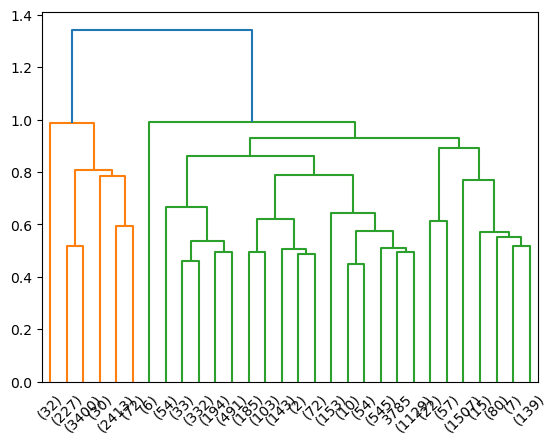

In [42]:
# Generate dendrogram
data_dist = pdist(X_std, metric='cosine')
data_link = linkage(data_dist, method='average', metric='cosine')
res = dendrogram(data_link, color_threshold=1.06, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_std.append((1.06, 'cosine', 'average'))

Method: **centroid**, threshold: 0.9, n_clusters: **3**

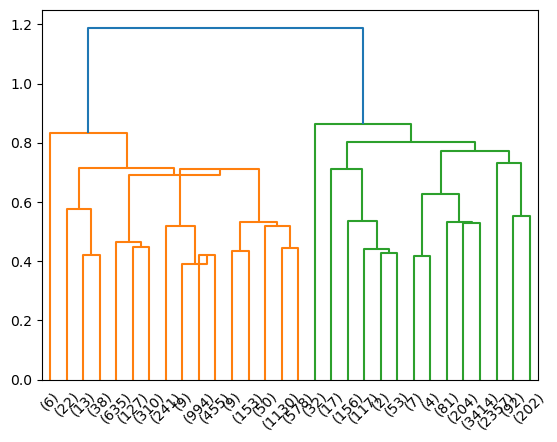

In [43]:
# Generate dendrogram
data_dist = pdist(X_std, metric='cosine')
data_link = linkage(data_dist, method='centroid', metric='cosine')
res = dendrogram(data_link, color_threshold=0.9, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_std.append((0.9, 'cosine', 'centroid'))

Method: **ward**, threshold: 35, n_clusters: **3**

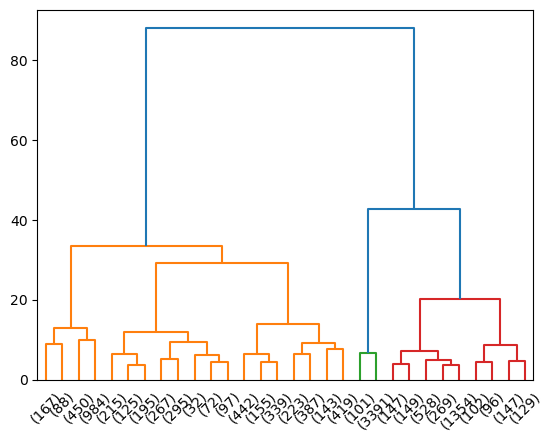

In [44]:
# Generate dendrogram
data_dist = pdist(X_std, metric='cosine')
data_link = linkage(data_dist, method='ward', metric='cosine')
res = dendrogram(data_link, color_threshold=35, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_std.append((35, 'cosine', 'ward'))

Fit clusterings with params found by exploring dendrograms

In [45]:
cluster_list_std = []
for treshold, metric_std, method_std in config_hierarchical_std:
    cluster = fclusterdata(X=X_std,
     t=treshold , criterion='distance', metric=metric_std, method=method_std)
     
    cluster_list_std.append(cluster)

Calculate Silhouette for each clustering.

In [46]:
print(len(cluster_list_std))
for i, cluster in enumerate(cluster_list_std):
    treshold, metric, method = config_hierarchical_std[i]
    
    try: # Exception in case of num_clusters=1
        silhouette = silhouette_score(X_std, cluster)
    except:
        silhouette = np.nan
    print("STD - dist:", metric, ", method:", method, ", SILHOUTTE:", silhouette, ", n_clusters:", len(np.unique(cluster)))

3
STD - dist: cosine , method: average , SILHOUTTE: 0.3326305069708165 , n_clusters: 2
STD - dist: cosine , method: centroid , SILHOUTTE: 0.35843139704732624 , n_clusters: 2
STD - dist: cosine , method: ward , SILHOUTTE: 0.29158302369777894 , n_clusters: 3


All 3 hierarchcal models have similar silhouette and same number of clusters, so we selected the clustering with *method: ward* because of the better cluster separation in the dendrogram.

Selcted for further analysis:
1.  STD normalization - dist: cosine, method: ward, n_clusters: 3, silhouette: 0.32
2.  MINMAX normalization - dist: cosine, method: ward, n_clusters: 2, silhouette: 0.67

In [47]:
hierarchical_final_3 = cluster_list_std[2] # Hierarchical clustering with 3 clusters
hierarchical_final_2 = cluster_list_minax[1] # Hierarchical clustering with 2 clusters
# These clusters are only a list of labels, one for each point

In [49]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(hierarchical_final_3,index=df.index)

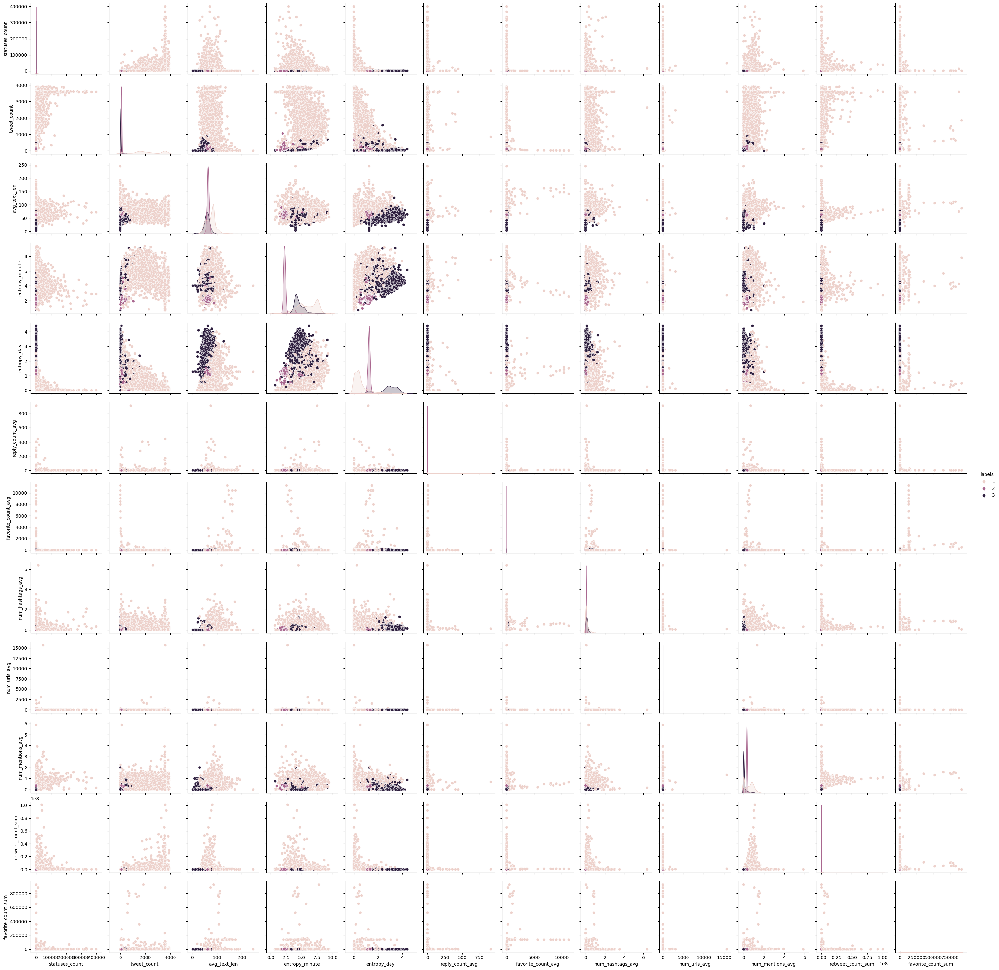

In [50]:
sns.pairplot(df,hue='labels')

In [51]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(hierarchical_final_2,index=df.index)

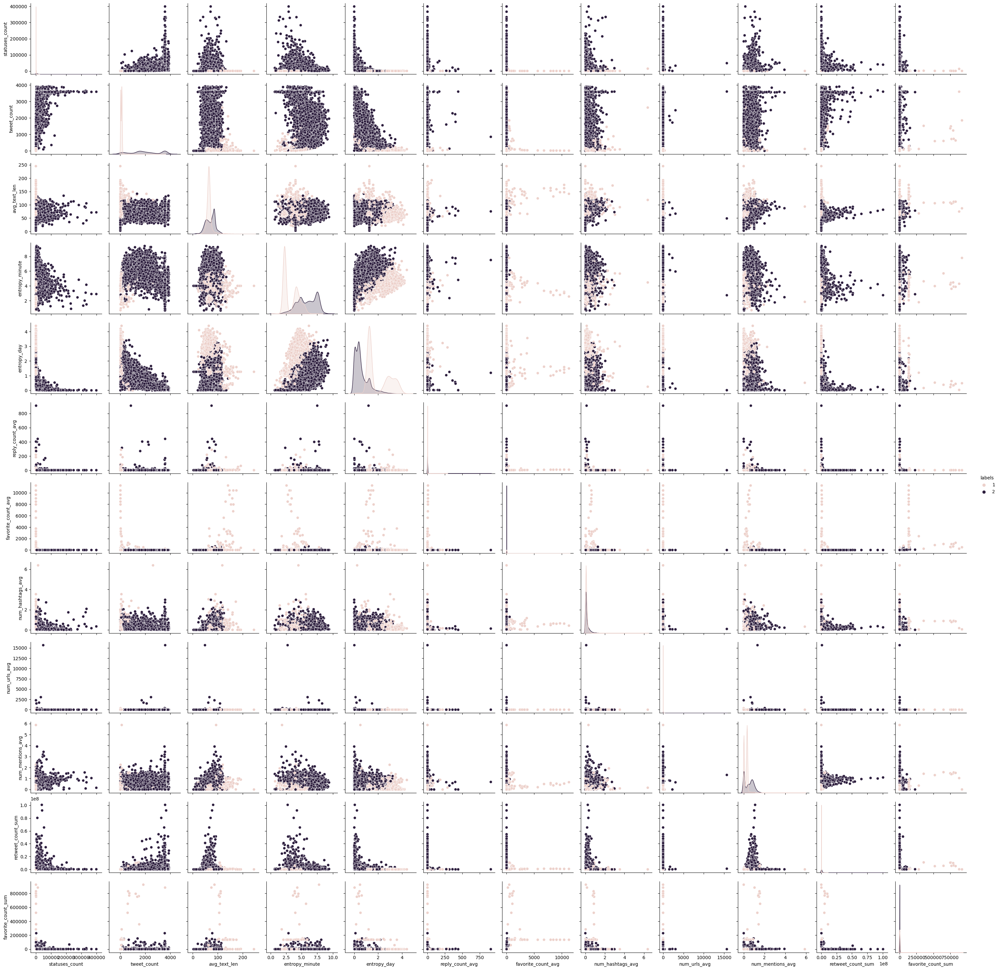

In [52]:
sns.pairplot(df,hue='labels')

TODO bot/non bot
(forse scatter)

TODO EXTRA: clusterizzazione bonus libreria esterna